# Seuillage Otsu

In [1]:
import torch
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from PIL import Image
import os
import random
import io
from IPython.display import Image as IPyImage, display

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

PyTorch version: 2.7.1+cu126
CUDA available: True


# Load la data

In [2]:
tiff_path = "data/EFR/Greyscale/EFRGP01_00.tif"

with tifffile.TiffFile(tiff_path) as tif:
    shape = tif.series[0].shape
    print(f"Image dimensions: {shape}")
    print(f"Data type: {tif.series[0].dtype}")
        
    if len(shape) == 3:
        depth, height, width = shape
    elif len(shape) == 2:
        height, width = shape
        depth = 1
    else:
        print("Unexpected image dimensions!")
            
    print(f"Depth (Z): {depth}, Height (Y): {height}, Width (X): {width}")


Image dimensions: (1600, 1400, 1400)
Data type: uint16
Depth (Z): 1600, Height (Y): 1400, Width (X): 1400


**On commence par extraire une region de 100 par 100 par 100**

In [3]:
def read_voxel_region(tiff_path, region_size=100, random_offset_range=50):
    with tifffile.TiffFile(tiff_path) as tif:
        shape = tif.series[0].shape
        
        if len(shape) == 3:
            depth, height, width = shape
        elif len(shape) == 2:
            height, width = shape
            depth = 1
        else:
            raise ValueError("Unexpected image dimensions!")
        
        center_z = depth // 2
        center_y = height // 2
        center_x = width // 2
        
        offset_z = random.randint(-random_offset_range, random_offset_range)
        offset_y = random.randint(-random_offset_range, random_offset_range)
        offset_x = random.randint(-random_offset_range, random_offset_range)
        
        start_z = max(0, min(center_z + offset_z - region_size//2, depth - region_size))
        start_y = max(0, min(center_y + offset_y - region_size//2, height - region_size))
        start_x = max(0, min(center_x + offset_x - region_size//2, width - region_size))
        
        end_z = start_z + region_size
        end_y = start_y + region_size
        end_x = start_x + region_size
        
        print(f"Reading region: Z[{start_z}:{end_z}], Y[{start_y}:{end_y}], X[{start_x}:{end_x}]")
        
        region = tif.asarray()[start_z:end_z, start_y:end_y, start_x:end_x]

        
        return region, (start_z, start_y, start_x)


In [4]:
print("Extracting 100x100x100 voxel region...")
voxel_region, start_coords = read_voxel_region(tiff_path, region_size=100, random_offset_range=50)

print(f"Region shape: {voxel_region.shape}")
print(f"Data type: {voxel_region.dtype}")
print(f"Value range: {voxel_region.min()} to {voxel_region.max()}")
print(f"Start coordinates: Z={start_coords[0]}, Y={start_coords[1]}, X={start_coords[2]}")

voxel_tensor = torch.from_numpy(voxel_region.astype(np.float32)).to('cuda')
print(f"PyTorch tensor shape: {voxel_tensor.shape}")
print(f"PyTorch tensor device: {voxel_tensor.device}")


Extracting 100x100x100 voxel region...
Reading region: Z[757:857], Y[609:709], X[680:780]
Region shape: (100, 100, 100)
Data type: uint16
Value range: 10376 to 56864
Start coordinates: Z=757, Y=609, X=680
PyTorch tensor shape: torch.Size([100, 100, 100])
PyTorch tensor device: cuda:0


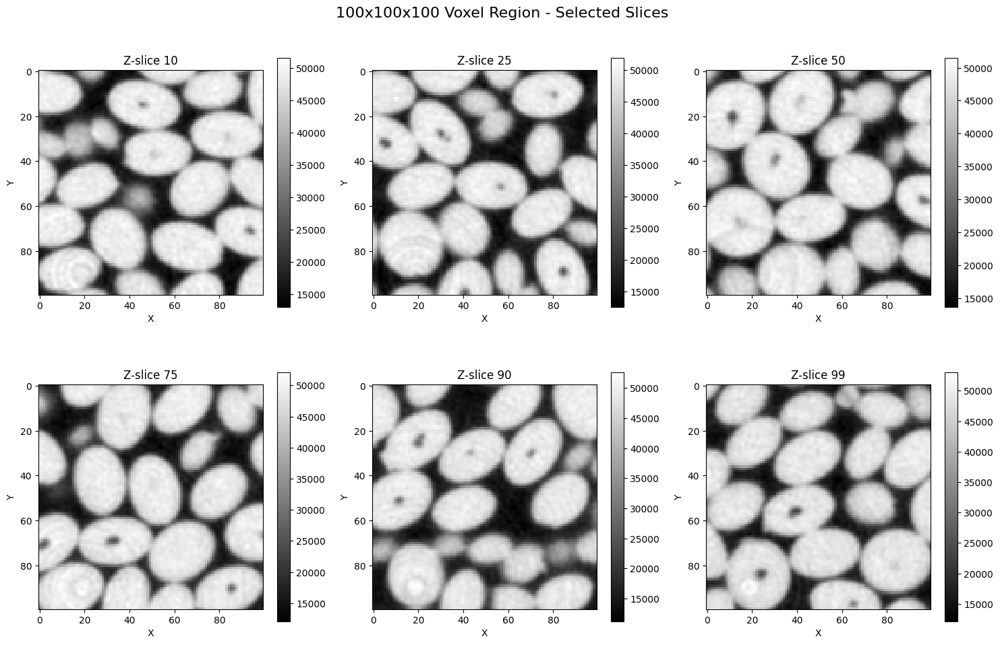

Displayed 6 slices from the 100x100x100 voxel region


In [5]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('100x100x100 Voxel Region - Selected Slices', fontsize=16)

slice_indices = [10, 25, 50, 75, 90, 99]

for i, slice_idx in enumerate(slice_indices):
    row = i // 3
    col = i % 3
    
    im = axes[row, col].imshow(voxel_region[slice_idx], cmap='gray', interpolation='nearest')
    axes[row, col].set_title(f'Z-slice {slice_idx}')
    axes[row, col].set_xlabel('X')
    axes[row, col].set_ylabel('Y')
    
    plt.colorbar(im, ax=axes[row, col], shrink=0.8)

plt.tight_layout()
plt.show()

print(f"Displayed 6 slices from the 100x100x100 voxel region")


# We can also display the gif of the selected voxel region

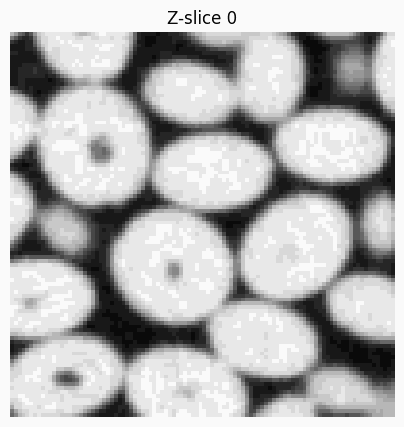

In [6]:

# Display a gif
slice_indices = [a for a in range(100)]
frames = []

for slice_idx in slice_indices:
    fig, ax = plt.subplots(figsize=(5, 5))
    im = ax.imshow(voxel_region[slice_idx], cmap='gray', interpolation='nearest')
    ax.set_title(f'Z-slice {slice_idx}')
    ax.axis('off')

    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight')
    plt.close(fig)
    
    buf.seek(0)
    frame = Image.open(buf)
    frames.append(frame)


def display_gif(frames) :
    # Save as GIF in-memory
    gif_buf = io.BytesIO()
    frames[0].save(gif_buf, format='GIF', save_all=True, append_images=frames[1:], duration=100, loop=0)
    gif_buf.seek(0)
    
    # Display the GIF in notebook
    display(IPyImage(data=gif_buf.read()))

display_gif(frames)

In [7]:
from skimage import filters

def preprocess_for_watershed(voxel):
    voxel = voxel.astype(np.float32)
    voxel = (voxel - voxel.min()) / (voxel.max() - voxel.min())  # [0,1]
    smoothed = filters.gaussian(voxel, sigma=1)
    return smoothed


preprocessed = preprocess_for_watershed(voxel_region)


In [8]:
from scipy import ndimage as ndi
from skimage import morphology, segmentation, filters

def segment_grains_adaptatif(voxel):
    thresh = voxel > filters.threshold_otsu(voxel)
    
    distance = ndi.distance_transform_edt(thresh)

    local_maxi = morphology.local_maxima(distance)
    markers, _ = ndi.label(local_maxi)

    labels = segmentation.watershed(-distance, markers, mask=thresh)

    return labels


labels = segment_grains_adaptatif(preprocessed)


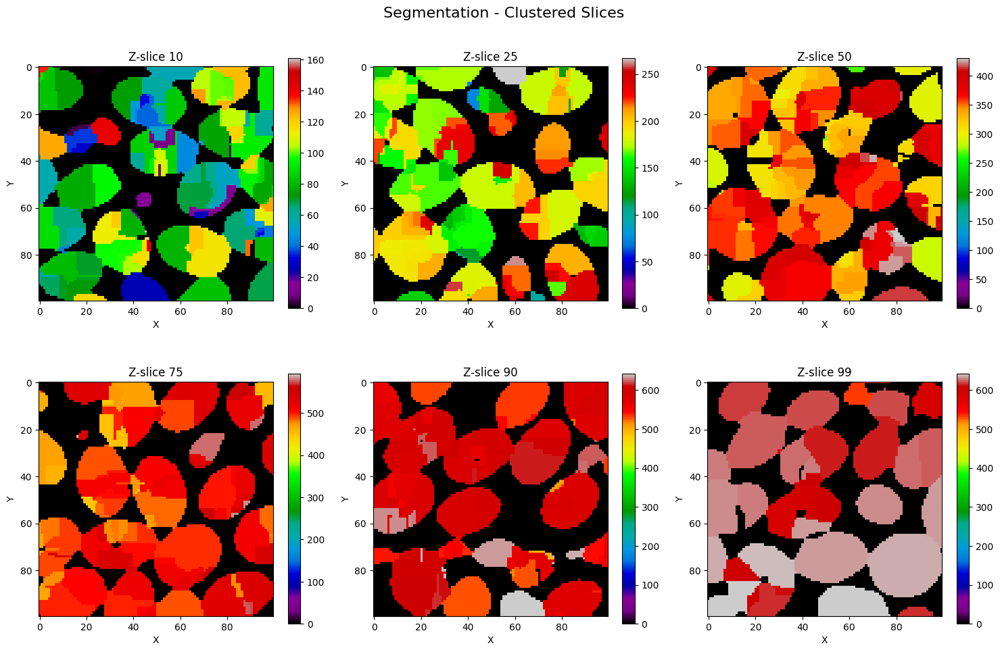

In [9]:
from skimage.measure import regionprops

def plot_segmentation(labels):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle('Segmentation - Clustered Slices', fontsize=16)

    slice_indices = [10, 25, 50, 75, 90, 99]

    for i, slice_idx in enumerate(slice_indices):
        row = i // 3
        col = i % 3

        im = axes[row, col].imshow(labels[slice_idx], cmap='nipy_spectral', interpolation='nearest')
        axes[row, col].set_title(f'Z-slice {slice_idx}')
        axes[row, col].set_xlabel('X')
        axes[row, col].set_ylabel('Y')
        plt.colorbar(im, ax=axes[row, col], shrink=0.8)

    plt.tight_layout()
    plt.show()


def clean_labels(labels, min_size=100):
    props = regionprops(labels)
    clean = np.zeros_like(labels, dtype=np.uint16)
    new_label = 1
    for p in props:
        if p.area >= min_size:
            clean[labels == p.label] = new_label
            new_label += 1
    return clean

labels_cleaned = clean_labels(labels, min_size=100)

plot_segmentation(labels_cleaned)


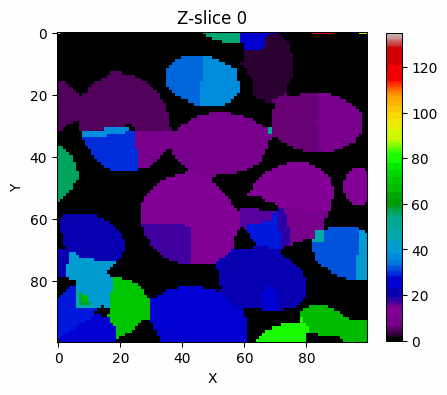

In [10]:
slice_indices = [a for a in range(100)]
frames = []

for i, slice_idx in enumerate(slice_indices):
    row = i // 3
    col = i % 3

    fig, ax = plt.subplots(figsize=(5, 5))
    im = ax.imshow(labels_cleaned[slice_idx], cmap='nipy_spectral', interpolation='nearest')
    ax.set_title(f'Z-slice {slice_idx}')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    plt.colorbar(im, ax=ax, shrink=0.8)

    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight')
    plt.close(fig)
    
    buf.seek(0)
    frame = Image.open(buf)
    frames.append(frame)

display_gif(frames)

In [11]:
from skimage.measure import regionprops_table
import pandas as pd

def analyze_labels(labels):
    props = regionprops_table(
        labels,
        properties=[
            'label',
            'area',
            'centroid',
            'bbox'
        ]
    )
    df = pd.DataFrame(props)
    df = df.sort_values('area', ascending=False)
    print(f"→ {len(df)} grains détectés")
    return df


grain_stats = analyze_labels(labels_cleaned)
print(grain_stats.head())


→ 642 grains détectés
     label    area  centroid-0  centroid-1  centroid-2  bbox-0  bbox-1  \
531    532  6616.0   84.652358    6.192261   64.796705      66       0   
494    495  5860.0   76.483788   70.272696   66.027304      66      60   
286    287  5768.0   41.560160   77.664008   93.632108      27      64   
528    529  4540.0   86.633921   90.308370   40.410352      74      79   
13      14  4401.0    3.679845   57.506021   43.707794       0      45   

     bbox-2  bbox-3  bbox-4  bbox-5  
531      46     100      22      78  
494      49      91      81      80  
286      84      56      92     100  
528      29      98     100      51  
13       27      11      75      59  


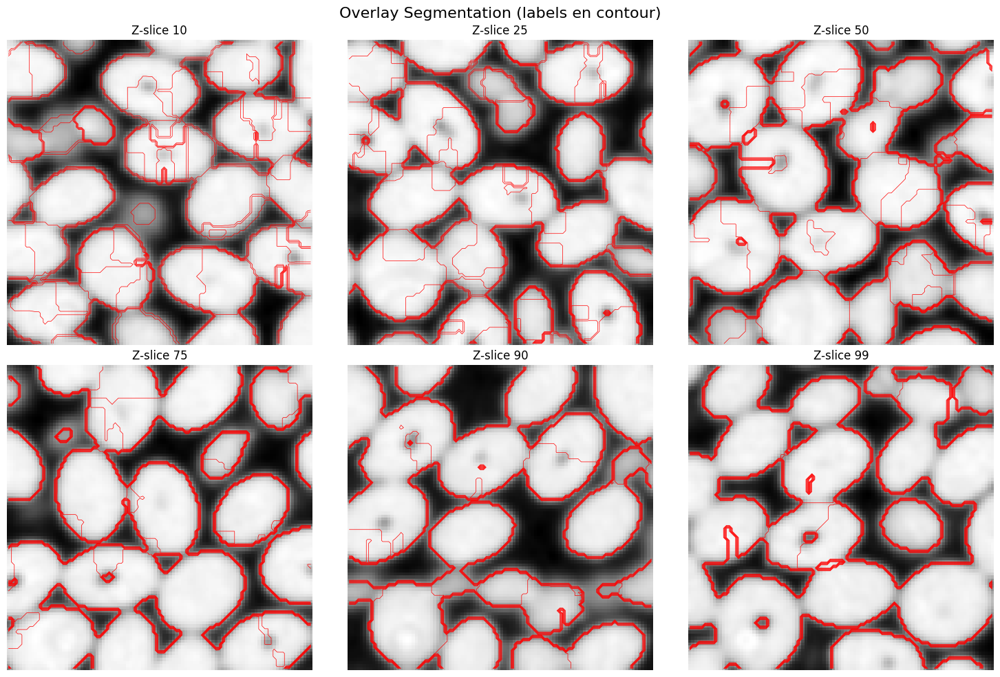

In [12]:
def plot_labels_overlay(voxel, labels, slices=None):
    import matplotlib.pyplot as plt

    if slices is None:
        slices = [10, 25, 50, 75, 90, 99]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle('Overlay Segmentation (labels en contour)', fontsize=16)

    for i, idx in enumerate(slices):
        ax = axes[i // 3, i % 3]
        ax.imshow(voxel[idx], cmap='gray')
        ax.contour(labels[idx], colors='red', linewidths=0.5)
        ax.set_title(f"Z-slice {idx}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()
plot_labels_overlay(preprocessed, labels_cleaned)


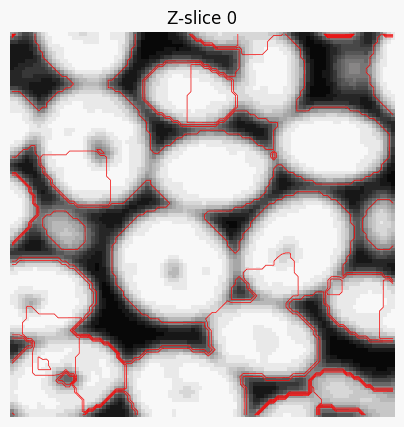

In [13]:
slice_indices = [a for a in range(100)]
frames = []

for i, idx in enumerate(slice_indices):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(preprocessed[idx], cmap='gray')
    ax.contour(labels[idx], colors='red', linewidths=0.5)
    ax.set_title(f"Z-slice {idx}")
    ax.axis('off')

    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight')
    plt.close(fig)
    
    buf.seek(0)
    frame = Image.open(buf)
    frames.append(frame)

display_gif(frames)

In [ ]:
from tqdm import tqdm
from sklearn.metrics import silhouette_score

def evaluate_clustering(voxel, labels):
    z, y, x = np.indices(voxel.shape)
    features = np.stack([
        voxel.ravel(),
        x.ravel() / voxel.shape[2],
        y.ravel() / voxel.shape[1],
        z.ravel() / voxel.shape[0]
    ], axis=1)
    
    flat_labels = labels.ravel()
    
    print("→ Calcul du silhouette score...")
    chunks = np.array_split(np.arange(flat_labels.shape[0]), 20)
    scores = []
    for chunk in tqdm(chunks):
        scores.append(silhouette_score(features[chunk], flat_labels[chunk]))
    
    mean_score = np.mean(scores)
    print(f"Silhouette score moyen (approximé) : {mean_score:.4f}")


evaluate_clustering(preprocessed, labels_cleaned)


→ Calcul du silhouette score...


 10%|███████▏                                                                | 2/20 [01:01<09:13, 30.76s/it]